https://stackoverflow.com/questions/53838696/problems-regarding-pyomo-provided-math-functions

https://stackoverflow.com/questions/70048818/optimization-of-a-battery-storage-with-pyomo

https://gitlab.com/diw-evu/emobpy/emobpy/-/blob/master/emobpy/data/evspecs.json

https://github.com/L-Strobel/jointAnalysisCharging/tree/main/chargingmodel

In [1]:
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt#
import matplotlib.axes as axes
import pyomo.environ as pyo 
import pyomo.opt as opt
from IPython.display import clear_output
from pyomo.opt import SolverFactory
import random
from pandas import Timestamp
import pickle
import matplotlib.dates as mdates

## Data input 

In [102]:
V2G = False
short_or_long = "medium" #short: short, medium, long
flex = "full" #constrained meaning that late charging cannot be applied to the fullest extent
soc_min = 0.1 #level that should preferably be reached as soon as possible

In [103]:
#emobpy import
processing_path = os.getcwd()
if short_or_long == "short": 
    os.chdir("../emobpy/short")
elif short_or_long == "medium": 
    os.chdir("../emobpy/medium")
else:
    os.chdir("../emobpy/long")
data_path = os.getcwd()
os.chdir(processing_path)
pics = os.path.join(processing_path, "Pictures","V2G" if V2G else "G2V", short_or_long)
if soc_min >0: 
    os.makedirs(os.path.join(processing_path, "Pictures", f"{soc_min}"), exist_ok = True)
    pics = os.path.join(processing_path, "Pictures", f"{soc_min}")

pics_input = os.path.join(pics, "input")

    

consumption_ts = pd.read_pickle(os.path.join(data_path,  "consumption"))
consumption_ts = consumption_ts*1000/4  #W/h --> kW/15min_timestep
availability_ts = pd.read_pickle(os.path.join(data_path, "availability"))
car_properties_ts = pd.read_pickle(os.path.join(data_path,  "properties")) 

profiles = min(consumption_ts.shape[1], availability_ts.shape[1], car_properties_raw.shape[1])
if short_or_long == "long":
    time_steps = len(availability_ts.dropna().index)
else: 
    days = 12
    time_steps = consumption_ts[consumption_ts.index.day<=days].shape[0]


In [104]:
len(availability_ts.dropna().index)

1200

In [105]:
 min(consumption_ts.shape[1], availability_ts.shape[1], car_properties_raw.shape[1])

7408

In [106]:
car_properties_ts.iloc[0] = 1
car_properties_ts.iloc[1] = 1

In [107]:
overestimation_sensitivity = {
    "profiles":{},
    "time_steps": {}
}
profiles_old = profiles 
time_steps_old = time_steps
varying_time = True
df_profiles, df_time_steps = pd.DataFrame(), pd.DataFrame()

if varying_time: 
    tuple_list = zip(
    range(100, time_steps_old, round((time_steps_old-100)/5)),
    [profiles_old] * 5)
else: 
    tuple_list = zip(
    [time_steps_old] * 5,
    range(1, profiles_old, round(profiles_old/5)))

In [108]:
list(range(1, profiles_old, round(profiles_old/5)))

[1, 1483, 2965, 4447, 5929]

In [109]:
list(range(100, time_steps_old, round((time_steps_old-100)/5)))

[100, 310, 520, 730, 940, 1150]

In [110]:
#for time_steps, profiles in tuple_list:
timpe_steps = 1200
profiles = 7408
print(f'{time_steps}_{profiles}')
consumption_raw, power_raw, car_properties_raw = consumption_ts.iloc[:time_steps, :profiles].dropna(), availability_ts.iloc[:time_steps, :profiles].dropna(), car_properties_ts.iloc[:, :profiles].dropna()
neg_power_magnitude_raw = power_raw

#set datetime indexes 
index = consumption_ts.index[:time_steps]
consumption_raw.index, power_raw.index, neg_power_magnitude_raw.index = index, index, index


#set same names for columns
power_raw.columns = consumption_raw.columns
neg_power_magnitude_raw.columns = consumption_raw.columns
car_properties_raw.columns = consumption_raw.columns
solution_dict = {}
ees_constraints= pd.DataFrame()
M = 10000
failed_profiles = []

for car in consumption_raw.columns.unique():
    try: 
        car_list = consumption_raw[car].columns
    except AttributeError as a:
        car_list = [car]

    for i, c in enumerate(car_list):
        if type(consumption_raw[c]) == pd.core.series.Series:
            consumption = consumption_raw[c]
            power = power_raw[car]
            neg_power_magnitude = neg_power_magnitude_raw[c]
            car_properties = car_properties_raw[c]

        else: 
            consumption = consumption_raw[c].iloc[:,i]
            power= power_raw[car].iloc[:,i]
            neg_power_magnitude= neg_power_magnitude_raw[c].iloc[:,i]
            car_properties= car_properties_raw[c].iloc[:,i]


        solution_dict[car+str(i)] = {}
        battery_capacity = car_properties.loc["battery_capacity"]
        level_0 = car_properties["soc_init"]*battery_capacity
        level_T = car_properties.loc["soc_end"]*battery_capacity

        for model_type in ["m_early", "m_late"]:
            if (model_type == "m_late") & (car+str(i) in failed_profiles): 
                pass
            else:
                #Initialize model
                m = pyo.ConcreteModel()

                #initialize sets
                m.t = pyo.Set(initialize = index, ordered = True)

                #Initialize parameter
                m.consumption = pyo.Param(m.t, initialize=consumption.to_dict())
                m.power = pyo.Param(m.t, initialize=power.to_dict()) 
                m.neg_power = pyo.Param(m.t, initialize=neg_power_magnitude.to_dict()) 

                #Initialize variables
                m.CHARGE = pyo.Var(m.t, within = pyo.NonNegativeReals)
                m.SLACK = pyo.Var(m.t, within = pyo.NonNegativeReals)
                m.DISCHARGE = pyo.Var(m.t, within = pyo.NonNegativeReals)
                m.LEVEL = pyo.Var(m.t, within = pyo.NonNegativeReals, 
                                  bounds = (0,battery_capacity))

                if ((model_type == "m_late") & (flex=="constrained")): ###
                    con = consumption_raw[car].iloc[:, i]
                    ava = power_raw[car].iloc[:, i]

                    public_index = ava[(ava!=3.33)].index
                    dep_home_index = con[((con==0) & (con.shift(-1) > 0) == True) & (ava==3.33)].index

                    m.t_pub = pyo.Set(initialize = public_index, ordered = True)
                    m.t_dep_home = pyo.Set(initialize = dep_home_index, ordered = True)

                    def full_before_next_trip(m, t_dep): ####
                        if t_dep in  index[:2]:
                            return pyo.Constraint.Skip
                        else:
                            t_dep_1 = pd.Timestamp(t_dep) - pd.Timedelta(flex_dict[3.33]["time_steps"]*pd.infer_freq(index))
                            return m.LEVEL[t_dep_1] >= solution_dict[car+str(i)]["m_early"]["level"].loc[t_dep_1]
                    m.Full_before_next_trip = pyo.Constraint(m.t_dep_home, rule=full_before_next_trip)

                    def public_uncontrolled(m, t_dep):  
                        return m.LEVEL[t_dep] >= solution_dict[car+str(i)]["m_early"]["level"].loc[t_dep]
                    m.Public_uncontrolled = pyo.Constraint(m.t_pub, rule=public_uncontrolled)

                #level constraints
                def recursive_level(m, t):
                    if t == index[0]:
                        return m.LEVEL[t] == level_0 + (m.CHARGE[t] - m.DISCHARGE[t] - m.consumption[t] )*step_duration
                    else:    
                        return m.LEVEL[t] == m.LEVEL[pd.Timestamp(t) - 
                                                         pd.Timedelta(pd.infer_freq(index))] + (
                            m.CHARGE[t] - m.DISCHARGE[t] - m.consumption[t] )*step_duration   
                m.Recursive_level = pyo.Constraint(m.t, rule = recursive_level)

                def final_level(m, t):
                    if t == index[-1]:
                        return m.LEVEL[t] == level_T
                    else: 
                        return pyo.Constraint.Skip
                m.Final_level = pyo.Constraint(m.t, rule=final_level)

                #bidirectional charging 
                def neg_power_min(m, t):
                    if V2G == True:
                        return m.DISCHARGE[t] <= m.neg_power[t] 
                    else:
                        return m.DISCHARGE[t] ==0
                m.Neg_power_min_restriction = pyo.Constraint(m.t, rule=neg_power_min)

                def power_max(m, t):
                    return m.CHARGE[t] <= m.power[t]   
                m.Power_max_restriction = pyo.Constraint(m.t, rule=power_max)

                def avoid_min_level(m, t):
                    return m.LEVEL[t] + m.SLACK[t] >= battery_capacity*soc_min
                m.Avoid_min_level = pyo.Constraint(m.t, rule=avoid_min_level)

                def battery_level_sum(m, t):    
                    if model_type == "m_late":
                        return sum(m.LEVEL[t] + M * m.SLACK[t] for t in m.t) 
                    else:
                        return sum(m.LEVEL[t] for t in m.t) 
                if model_type == "m_late": sense = pyo.minimize
                else: sense = pyo.maximize

                m.Obj = pyo.Objective(rule=battery_level_sum, sense=sense)

                #find solver
                solvername='glpk'

                #prepare solver
                optimizer = opt.SolverFactory(solvername) 
                solved_model = optimizer.solve(m)      ##tee=True   

                if pd.DataFrame.from_dict(m.LEVEL.extract_values(), orient='index')[0][-1]== None:
                    failed_profiles.append(car+str(i))
                else:    
                    level_series = pd.concat([
                        pd.Series(0, index=[index[0]-pd.Timedelta(pd.infer_freq(index))]),
                        pd.DataFrame.from_dict(m.LEVEL.extract_values(), orient='index')[0]
                    ], axis=0)
                    charge_df = pd.DataFrame.from_dict(m.CHARGE.extract_values(), orient='index', columns = [car])
                    discharge_df = pd.DataFrame.from_dict(m.DISCHARGE.extract_values(), orient='index', columns = [car])

                    #store data in dictionary
                    solution_dict[car+str(i)][model_type] = {}
                    solution_dict[car+str(i)][model_type]["level"] = level_series
                    solution_dict[car+str(i)][model_type]["charge"] = charge_df
                    solution_dict[car+str(i)][model_type]["discharge"] = discharge_df
                    level_index = solution_dict[car+str(i)][model_type]["level"].index
solution_dict["failed_profiles"] = failed_profiles

uncontrolled_level_accurate, uncontrolled_charge_df, early, late, ees_individual = pd.DataFrame(), pd.DataFrame(), pd.DataFrame(), pd.DataFrame(),pd.DataFrame()
df_con, df_pow, df_neg_pow, df_pro =  pd.DataFrame(), pd.DataFrame(),pd.DataFrame(),pd.DataFrame()

for c in consumption_raw.columns.unique():
    try: 
        car_list = consumption_raw[c].columns
    except AttributeError as a:
        car_list = [c]
    for i, car in enumerate(car_list):
        if car+str(i) not in solution_dict["failed_profiles"] :
            if type(consumption_raw[car]) == pd.core.series.Series: 
                df_con[car] = consumption_raw[car]
                df_pow[car] = power_raw[car]
                df_neg_pow[car] = neg_power_magnitude_raw[car]
                df_pro[car] = car_properties_raw[car]
            else: 
                df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
                df_pow[car+str(i)] = power_raw[car].iloc[:,i]
                df_neg_pow[car+str(i)] = neg_power_magnitude_raw[car].iloc[:,i]
                df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
            try: 
                early = pd.concat([
                    early, solution_dict[car+str(i)]["m_early"]["level"]
                ], axis=1).sum(1)
                late = pd.concat([
                   late, solution_dict[car+str(i)]["m_late"]["level"]
                ], axis=1).sum(1)
                ees_individual = pd.concat([
                     ees_individual, (solution_dict[car+str(i)]["m_early"]["level"]-solution_dict[car+str(i)]["m_late"]["level"])
                     ], axis=1)
                uncontrolled_charge_df = pd.concat([
                    uncontrolled_charge_df, solution_dict[car+str(i)]["m_early"]["charge"]
                ], axis=1)
                count += 1
            except KeyError: 
                pass

level_0_agg = sum(df_pro.loc["soc_init"]*df_pro.loc["battery_capacity"])
level_T_agg = sum(df_pro.loc["soc_end"]*df_pro.loc["battery_capacity"])   

uncontrolled_level_accurate = early
uncontrolled_level_accurate.iloc[0] = level_0_agg ##
uncontrolled_level_accurate.name = "uncontrolled_level"

uncontrolled_charge_accurate = uncontrolled_charge_df.sum(1)

uncontrolled_charge_accurate.name = "uncontrolled_charge"        
ees_constraints_aggergated=late-early

ees_constraints_aggergated = ees_individual.iloc[:time_steps+1, :profiles].sum(1)
level_index = ees_constraints_aggergated.index
aggregated_max_battery = df_pro.loc["battery_capacity"][ :profiles].sum()
consumption_aggregated =  pd.concat([
pd.Series(0, index=[index[0]-pd.Timedelta(pd.infer_freq(index))]), df_con.loc[level_index[1:]].sum(1)
          ], axis = 0)
consumption_aggregated.name = "consumption"

power_aggregated = pd.concat([
    pd.Series(0, index=[index[0]-pd.Timedelta(pd.infer_freq(index))]), df_pow.loc[level_index[1:]].sum(1)
              ], axis = 0)

neg_power_aggregated = pd.concat([
    pd.Series(0, index=[index[0]-pd.Timedelta(pd.infer_freq(index))]), df_neg_pow.loc[level_index[1:]].sum(1)
              ], axis = 0)
#aggregation
naive_constraints_aggergated = pd.Series(data=sum(
    df_pro.loc["battery_capacity"][ :profiles]), index=level_index) #all battery capicities

agg_overest_solutions = {}

for model_type in ["m_early_agg", "m_late_agg"]:
    #Initialize model
    m_agg = pyo.ConcreteModel()

    #initialize sets
    m_agg.t = pyo.Set(initialize = ees_constraints_aggergated.index, ordered = True)

    m_agg.consumption_aggregated = pyo.Param(m_agg.t, initialize=consumption_aggregated.to_dict())
    m_agg.power = pyo.Param(m_agg.t, initialize=power_aggregated.to_dict()) 
    m_agg.neg_power = pyo.Param(m_agg.t, initialize=neg_power_aggregated.to_dict()) 

    m_agg.LEVEL = pyo.Var(m_agg.t, within = pyo.NonNegativeReals, bounds=(
        0, aggregated_max_battery))
    m_agg.CHARGE = pyo.Var(m_agg.t, within = pyo.NonNegativeReals)
    m_agg.DISCHARGE = pyo.Var(m_agg.t, within = pyo.NonNegativeReals)

    if (model_type == "m_late_agg")  & (flex=="constrained"): ###
        dep_index = consumption_aggregated[(consumption_aggregated==0) & (consumption_aggregated.shift(-1) > 0) == True].index
        m_agg.t_dep = pyo.Set(initialize = dep_index, ordered = True)
        def full_before_next_trip(m_agg, t_dep):
            return m_agg.LEVEL[t_dep] >= uncontrolled_level_accurate[dep_index].loc[t_dep]
        m_agg.Full_before_next_trip = pyo.Constraint(m_agg.t_dep, rule=full_before_next_trip)

    #level constraints
    def recursive_level(m_agg, t):
        if t == level_index[0]:
            return m_agg.LEVEL[t] == level_0_agg + m_agg.CHARGE[t] - m_agg.consumption_aggregated[t]
        else:    
            return m_agg.LEVEL[t] == m_agg.LEVEL[pd.Timestamp(t) - 
                                             pd.Timedelta(pd.infer_freq(level_index))] + (
                m_agg.CHARGE[t] - m_agg.consumption_aggregated[t] - m_agg.DISCHARGE[t] )
    m_agg.Recursive_level = pyo.Constraint(m_agg.t, rule = recursive_level)

    def final_level(m_agg, t):
        if t == index[-1]:
            return m_agg.LEVEL[t] == level_T_agg
        else: 
            return pyo.Constraint.Skip
    m_agg.Final_level = pyo.Constraint(m_agg.t, rule=final_level)

    #bidirectional charging 
    def neg_power_min(m_agg, t):
        if V2G == True:
            return m_agg.DISCHARGE[t] <= m_agg.neg_power[t]
        else: 
            return m_agg.DISCHARGE[t] == 0
    m_agg.Neg_power_min_restriction = pyo.Constraint(m_agg.t, rule=neg_power_min)

    def power_max(m_agg, t):
        return m_agg.CHARGE[t] <= m_agg.power[t]   
    m_agg.Power_max_restriction = pyo.Constraint(m_agg.t, rule=power_max)

    def final_level(m_agg, t):
        if t == index[-1]:
            return m_agg.LEVEL[t] == level_T_agg
        else: 
            return pyo.Constraint.Skip
    m_agg.Final_level = pyo.Constraint(m_agg.t, rule=final_level)

    # objective function late
    def battery_level_sum(m_agg, t): 
        return sum(m_agg.LEVEL[t] for t in m_agg.t) 
    if model_type == "m_late_agg":
        sense = pyo.minimize
    elif model_type == "m_early_agg":
        sense = pyo.maximize     
    m_agg.Obj = pyo.Objective(rule=battery_level_sum, sense=sense)

    #find solver
    solvername='glpk'

    #prepare solver
    optimizer = opt.SolverFactory(solvername) 
    solved_model = optimizer.solve(m_agg, tee=True)        

    #store data in dictionary
    agg_overest_solutions[model_type] = pd.DataFrame.from_dict(
        m_agg.LEVEL.extract_values(), orient='index')[0]

overestimation = 1 + (
    (agg_overest_solutions["m_late_agg"] - agg_overest_solutions["m_early_agg"]).sum()
    - ees_constraints_aggergated.sum()
) / ees_constraints_aggergated.sum()

print(
    "potential overestimation factor: " + str(
        overestimation) + " : " + str((
    (agg_overest_solutions["m_late_agg"] - agg_overest_solutions["m_early_agg"]).sum()
    - ees_constraints_aggergated.sum()
) / ees_constraints_aggergated.sum()*100) + " %"
)
overestimation_sensitivity["time_steps" if varying_time else "profiles"][f'{time_steps}' if varying_time else f"{profiles}"] =  overestimation

1152_7408


C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_neg_pow[car+str(i)] = neg_power_magnitude_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_neg_pow[car+str(i)] = neg_power_magnitude_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_neg_pow[car+str(i)] = neg_power_magnitude_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_neg_pow[car+str(i)] = neg_power_magnitude_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_neg_pow[car+str(i)] = neg_power_magnitude_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_neg_pow[car+str(i)] = neg_power_magnitude_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` m

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_neg_pow[car+str(i)] = neg_power_magnitude_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_neg_pow[car+str(i)] = neg_power_magnitude_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_neg_pow[car+str(i)] = neg_power_magnitude_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, w

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, w

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_neg_pow[car+str(i)] = neg_power_magnitude_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_neg_pow[car+str(i)] = neg_power_magnitude_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` m

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_neg_pow[car+str(i)] = neg_power_magnitude_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, w

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_neg_pow[car+str(i)] = neg_power_magnitude_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_neg_pow[car+str(i)] = neg_power_magnitude_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_neg_pow[car+str(i)] = neg_power_magnitude_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, w

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_neg_pow[car+str(i)] = neg_power_magnitude_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_neg_pow[car+str(i)] = neg_power_magnitude_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_neg_pow[car+str(i)] = neg_power_magnitude_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_neg_pow[car+str(i)] = neg_power_magnitude_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_neg_pow[car+str(i)] = neg_power_magnitude_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_neg_pow[car+str(i)] = neg_power_magnitude_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` m

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, w

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_neg_pow[car+str(i)] = neg_power_magnitude_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` m

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_neg_pow[car+str(i)] = neg_power_magnitude_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_neg_pow[car+str(i)] = neg_power_magnitude_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_neg_pow[car+str(i)] = neg_power_magnitude_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` m

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_neg_pow[car+str(i)] = neg_power_magnitude_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_neg_pow[car+str(i)] = neg_power_magnitude_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_neg_pow[car+str(i)] = neg_power_magnitude_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_neg_pow[car+str(i)] = neg_power_magnitude_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` m

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, w

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_neg_pow[car+str(i)] = neg_power_magnitude_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_neg_pow[car+str(i)] = neg_power_magnitude_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` m

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_neg_pow[car+str(i)] = neg_power_magnitude_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_neg_pow[car+str(i)] = neg_power_magnitude_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_neg_pow[car+str(i)] = neg_power_magnitude_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, w

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_neg_pow[car+str(i)] = neg_power_magnitude_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_neg_pow[car+str(i)] = neg_power_magnitude_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_neg_pow[car+str(i)] = neg_power_magnitude_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` m

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_neg_pow[car+str(i)] = neg_power_magnitude_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_neg_pow[car+str(i)] = neg_power_magnitude_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, w

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_neg_pow[car+str(i)] = neg_power_magnitude_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` m

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, w

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_neg_pow[car+str(i)] = neg_power_magnitude_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_neg_pow[car+str(i)] = neg_power_magnitude_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` m

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, w

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_neg_pow[car+str(i)] = neg_power_magnitude_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` m

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_neg_pow[car+str(i)] = neg_power_magnitude_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_neg_pow[car+str(i)] = neg_power_magnitude_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_neg_pow[car+str(i)] = neg_power_magnitude_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_neg_pow[car+str(i)] = neg_power_magnitude_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` m

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_neg_pow[car+str(i)] = neg_power_magnitude_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, w

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_neg_pow[car+str(i)] = neg_power_magnitude_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_neg_pow[car+str(i)] = neg_power_magnitude_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` m

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_neg_pow[car+str(i)] = neg_power_magnitude_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, w

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_neg_pow[car+str(i)] = neg_power_magnitude_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_neg_pow[car+str(i)] = neg_power_magnitude_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` m

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_neg_pow[car+str(i)] = neg_power_magnitude_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_neg_pow[car+str(i)] = neg_power_magnitude_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_neg_pow[car+str(i)] = neg_power_magnitude_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` m

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_neg_pow[car+str(i)] = neg_power_magnitude_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_neg_pow[car+str(i)] = neg_power_magnitude_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_neg_pow[car+str(i)] = neg_power_magnitude_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_neg_pow[car+str(i)] = neg_power_magnitude_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_neg_pow[car+str(i)] = neg_power_magnitude_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_neg_pow[car+str(i)] = neg_power_magnitude_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, w

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, w

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, w

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_neg_pow[car+str(i)] = neg_power_magnitude_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_neg_pow[car+str(i)] = neg_power_magnitude_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_neg_pow[car+str(i)] = neg_power_magnitude_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` m

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, w

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_neg_pow[car+str(i)] = neg_power_magnitude_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_neg_pow[car+str(i)] = neg_power_magnitude_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` m

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_neg_pow[car+str(i)] = neg_power_magnitude_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` m

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_neg_pow[car+str(i)] = neg_power_magnitude_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` m

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_neg_pow[car+str(i)] = neg_power_magnitude_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` m

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, w

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, w

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, w

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_neg_pow[car+str(i)] = neg_power_magnitude_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` m

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_neg_pow[car+str(i)] = neg_power_magnitude_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` m

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_neg_pow[car+str(i)] = neg_power_magnitude_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` m

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_neg_pow[car+str(i)] = neg_power_magnitude_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` m

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_neg_pow[car+str(i)] = neg_power_magnitude_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, w

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_neg_pow[car+str(i)] = neg_power_magnitude_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, w

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_neg_pow[car+str(i)] = neg_power_magnitude_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` m

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_neg_pow[car+str(i)] = neg_power_magnitude_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` m

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_neg_pow[car+str(i)] = neg_power_magnitude_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` m

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_neg_pow[car+str(i)] = neg_power_magnitude_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` m

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_neg_pow[car+str(i)] = neg_power_magnitude_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` m

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_neg_pow[car+str(i)] = neg_power_magnitude_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` m

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_neg_pow[car+str(i)] = neg_power_magnitude_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` m

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_neg_pow[car+str(i)] = neg_power_magnitude_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` m

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_neg_pow[car+str(i)] = neg_power_magnitude_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, w

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_neg_pow[car+str(i)] = neg_power_magnitude_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` m

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_neg_pow[car+str(i)] = neg_power_magnitude_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` m

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, w

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_neg_pow[car+str(i)] = neg_power_magnitude_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_neg_pow[car+str(i)] = neg_power_magnitude_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` m

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_neg_pow[car+str(i)] = neg_power_magnitude_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` m

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_neg_pow[car+str(i)] = neg_power_magnitude_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` m

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_neg_pow[car+str(i)] = neg_power_magnitude_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` m

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_neg_pow[car+str(i)] = neg_power_magnitude_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` m

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_neg_pow[car+str(i)] = neg_power_magnitude_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` m

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_neg_pow[car+str(i)] = neg_power_magnitude_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, w

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_neg_pow[car+str(i)] = neg_power_magnitude_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` m

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_neg_pow[car+str(i)] = neg_power_magnitude_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, w

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_neg_pow[car+str(i)] = neg_power_magnitude_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_neg_pow[car+str(i)] = neg_power_magnitude_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_neg_pow[car+str(i)] = neg_power_magnitude_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_neg_pow[car+str(i)] = neg_power_magnitude_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` m

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, w

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_neg_pow[car+str(i)] = neg_power_magnitude_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_neg_pow[car+str(i)] = neg_power_magnitude_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_neg_pow[car+str(i)] = neg_power_magnitude_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` m

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, w

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_neg_pow[car+str(i)] = neg_power_magnitude_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_neg_pow[car+str(i)] = neg_power_magnitude_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` m

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_neg_pow[car+str(i)] = neg_power_magnitude_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_neg_pow[car+str(i)] = neg_power_magnitude_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_neg_pow[car+str(i)] = neg_power_magnitude_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` m

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_neg_pow[car+str(i)] = neg_power_magnitude_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` m

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_neg_pow[car+str(i)] = neg_power_magnitude_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_neg_pow[car+str(i)] = neg_power_magnitude_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` m

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_neg_pow[car+str(i)] = neg_power_magnitude_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_neg_pow[car+str(i)] = neg_power_magnitude_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` m

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, w

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_neg_pow[car+str(i)] = neg_power_magnitude_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_neg_pow[car+str(i)] = neg_power_magnitude_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` m

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_neg_pow[car+str(i)] = neg_power_magnitude_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_neg_pow[car+str(i)] = neg_power_magnitude_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` m

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_neg_pow[car+str(i)] = neg_power_magnitude_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_neg_pow[car+str(i)] = neg_power_magnitude_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_neg_pow[car+str(i)] = neg_power_magnitude_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_neg_pow[car+str(i)] = neg_power_magnitude_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, w

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_neg_pow[car+str(i)] = neg_power_magnitude_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, w

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, w

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_neg_pow[car+str(i)] = neg_power_magnitude_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_neg_pow[car+str(i)] = neg_power_magnitude_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_neg_pow[car+str(i)] = neg_power_magnitude_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_neg_pow[car+str(i)] = neg_power_magnitude_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_neg_pow[car+str(i)] = neg_power_magnitude_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` m

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, w

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_neg_pow[car+str(i)] = neg_power_magnitude_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_neg_pow[car+str(i)] = neg_power_magnitude_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_neg_pow[car+str(i)] = neg_power_magnitude_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_neg_pow[car+str(i)] = neg_power_magnitude_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` m

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_neg_pow[car+str(i)] = neg_power_magnitude_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_neg_pow[car+str(i)] = neg_power_magnitude_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_neg_pow[car+str(i)] = neg_power_magnitude_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` m

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, w

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_neg_pow[car+str(i)] = neg_power_magnitude_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, w

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_neg_pow[car+str(i)] = neg_power_magnitude_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_neg_pow[car+str(i)] = neg_power_magnitude_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_neg_pow[car+str(i)] = neg_power_magnitude_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_neg_pow[car+str(i)] = neg_power_magnitude_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` m

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_neg_pow[car+str(i)] = neg_power_magnitude_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_neg_pow[car+str(i)] = neg_power_magnitude_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, w

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_neg_pow[car+str(i)] = neg_power_magnitude_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, w

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_neg_pow[car+str(i)] = neg_power_magnitude_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_neg_pow[car+str(i)] = neg_power_magnitude_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_neg_pow[car+str(i)] = neg_power_magnitude_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_neg_pow[car+str(i)] = neg_power_magnitude_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_neg_pow[car+str(i)] = neg_power_magnitude_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_neg_pow[car+str(i)] = neg_power_magnitude_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_neg_pow[car+str(i)] = neg_power_magnitude_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` m

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_neg_pow[car+str(i)] = neg_power_magnitude_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_neg_pow[car+str(i)] = neg_power_magnitude_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, w

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_neg_pow[car+str(i)] = neg_power_magnitude_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_neg_pow[car+str(i)] = neg_power_magnitude_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, w

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_neg_pow[car+str(i)] = neg_power_magnitude_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_neg_pow[car+str(i)] = neg_power_magnitude_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` m

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, w

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_neg_pow[car+str(i)] = neg_power_magnitude_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, w

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_neg_pow[car+str(i)] = neg_power_magnitude_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, w

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_neg_pow[car+str(i)] = neg_power_magnitude_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, w

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_neg_pow[car+str(i)] = neg_power_magnitude_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_neg_pow[car+str(i)] = neg_power_magnitude_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` m

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, w

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_neg_pow[car+str(i)] = neg_power_magnitude_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_neg_pow[car+str(i)] = neg_power_magnitude_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` m

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, w

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_neg_pow[car+str(i)] = neg_power_magnitude_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, w

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_neg_pow[car+str(i)] = neg_power_magnitude_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, w

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_neg_pow[car+str(i)] = neg_power_magnitude_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, w

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_neg_pow[car+str(i)] = neg_power_magnitude_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_neg_pow[car+str(i)] = neg_power_magnitude_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_neg_pow[car+str(i)] = neg_power_magnitude_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` m

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_neg_pow[car+str(i)] = neg_power_magnitude_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, w

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_neg_pow[car+str(i)] = neg_power_magnitude_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, w

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_neg_pow[car+str(i)] = neg_power_magnitude_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, w

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, w

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_neg_pow[car+str(i)] = neg_power_magnitude_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, w

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_neg_pow[car+str(i)] = neg_power_magnitude_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_neg_pow[car+str(i)] = neg_power_magnitude_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` m

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_neg_pow[car+str(i)] = neg_power_magnitude_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, w

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_neg_pow[car+str(i)] = neg_power_magnitude_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_neg_pow[car+str(i)] = neg_power_magnitude_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_neg_pow[car+str(i)] = neg_power_magnitude_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_neg_pow[car+str(i)] = neg_power_magnitude_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_neg_pow[car+str(i)] = neg_power_magnitude_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` m

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_neg_pow[car+str(i)] = neg_power_magnitude_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` m

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_neg_pow[car+str(i)] = neg_power_magnitude_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_neg_pow[car+str(i)] = neg_power_magnitude_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` m

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, w

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_neg_pow[car+str(i)] = neg_power_magnitude_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_neg_pow[car+str(i)] = neg_power_magnitude_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` m

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, w

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_neg_pow[car+str(i)] = neg_power_magnitude_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_neg_pow[car+str(i)] = neg_power_magnitude_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` m

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_neg_pow[car+str(i)] = neg_power_magnitude_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_neg_pow[car+str(i)] = neg_power_magnitude_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` m

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, w

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_neg_pow[car+str(i)] = neg_power_magnitude_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_neg_pow[car+str(i)] = neg_power_magnitude_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` m

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_neg_pow[car+str(i)] = neg_power_magnitude_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` m

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_neg_pow[car+str(i)] = neg_power_magnitude_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` m

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, w

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_neg_pow[car+str(i)] = neg_power_magnitude_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, w

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_neg_pow[car+str(i)] = neg_power_magnitude_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` m

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, w

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, w

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_neg_pow[car+str(i)] = neg_power_magnitude_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_neg_pow[car+str(i)] = neg_power_magnitude_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` m

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_neg_pow[car+str(i)] = neg_power_magnitude_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` m

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_neg_pow[car+str(i)] = neg_power_magnitude_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_neg_pow[car+str(i)] = neg_power_magnitude_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, w

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_neg_pow[car+str(i)] = neg_power_magnitude_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, w

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_neg_pow[car+str(i)] = neg_power_magnitude_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_neg_pow[car+str(i)] = neg_power_magnitude_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, w

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_neg_pow[car+str(i)] = neg_power_magnitude_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` m

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, w

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, w

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_neg_pow[car+str(i)] = neg_power_magnitude_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, w

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_neg_pow[car+str(i)] = neg_power_magnitude_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_neg_pow[car+str(i)] = neg_power_magnitude_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` m

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_neg_pow[car+str(i)] = neg_power_magnitude_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` m

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, w

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_neg_pow[car+str(i)] = neg_power_magnitude_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, w

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_neg_pow[car+str(i)] = neg_power_magnitude_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` m

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, w

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_neg_pow[car+str(i)] = neg_power_magnitude_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_neg_pow[car+str(i)] = neg_power_magnitude_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, w

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_neg_pow[car+str(i)] = neg_power_magnitude_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_neg_pow[car+str(i)] = neg_power_magnitude_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` m

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, w

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_neg_pow[car+str(i)] = neg_power_magnitude_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, w

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_neg_pow[car+str(i)] = neg_power_magnitude_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, w

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_neg_pow[car+str(i)] = neg_power_magnitude_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_neg_pow[car+str(i)] = neg_power_magnitude_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` m

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, w

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_neg_pow[car+str(i)] = neg_power_magnitude_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` m

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_neg_pow[car+str(i)] = neg_power_magnitude_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` m

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_neg_pow[car+str(i)] = neg_power_magnitude_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, w

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, w

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_neg_pow[car+str(i)] = neg_power_magnitude_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` m

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_neg_pow[car+str(i)] = neg_power_magnitude_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_neg_pow[car+str(i)] = neg_power_magnitude_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` m

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, w

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_neg_pow[car+str(i)] = neg_power_magnitude_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, w

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, w

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_neg_pow[car+str(i)] = neg_power_magnitude_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` m

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, w

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_neg_pow[car+str(i)] = neg_power_magnitude_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_neg_pow[car+str(i)] = neg_power_magnitude_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_neg_pow[car+str(i)] = neg_power_magnitude_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` m

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, w

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_neg_pow[car+str(i)] = neg_power_magnitude_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, w

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, w

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_neg_pow[car+str(i)] = neg_power_magnitude_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` m

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, w

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, w

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_neg_pow[car+str(i)] = neg_power_magnitude_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, w

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, w

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_neg_pow[car+str(i)] = neg_power_magnitude_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_neg_pow[car+str(i)] = neg_power_magnitude_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` m

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, w

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_neg_pow[car+str(i)] = neg_power_magnitude_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, w

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_neg_pow[car+str(i)] = neg_power_magnitude_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` m

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_neg_pow[car+str(i)] = neg_power_magnitude_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` m

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, w

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, w

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_neg_pow[car+str(i)] = neg_power_magnitude_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_neg_pow[car+str(i)] = neg_power_magnitude_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` m

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_neg_pow[car+str(i)] = neg_power_magnitude_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, w

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_neg_pow[car+str(i)] = neg_power_magnitude_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` m

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, w

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_neg_pow[car+str(i)] = neg_power_magnitude_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_neg_pow[car+str(i)] = neg_power_magnitude_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` m

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, w

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_neg_pow[car+str(i)] = neg_power_magnitude_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` m

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, w

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_neg_pow[car+str(i)] = neg_power_magnitude_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` m

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, w

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, w

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_neg_pow[car+str(i)] = neg_power_magnitude_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, w

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, w

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_neg_pow[car+str(i)] = neg_power_magnitude_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` m

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, w

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, w

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, w

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_neg_pow[car+str(i)] = neg_power_magnitude_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` m

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_neg_pow[car+str(i)] = neg_power_magnitude_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` m

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, w

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, w

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_neg_pow[car+str(i)] = neg_power_magnitude_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` m

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, w

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_neg_pow[car+str(i)] = neg_power_magnitude_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, w

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_neg_pow[car+str(i)] = neg_power_magnitude_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` m

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, w

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_neg_pow[car+str(i)] = neg_power_magnitude_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` m

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_neg_pow[car+str(i)] = neg_power_magnitude_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` m

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_neg_pow[car+str(i)] = neg_power_magnitude_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` m

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_neg_pow[car+str(i)] = neg_power_magnitude_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` m

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_neg_pow[car+str(i)] = neg_power_magnitude_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` m

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_neg_pow[car+str(i)] = neg_power_magnitude_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` m

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, w

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, w

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_neg_pow[car+str(i)] = neg_power_magnitude_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` m

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, w

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_neg_pow[car+str(i)] = neg_power_magnitude_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` m

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_neg_pow[car+str(i)] = neg_power_magnitude_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` m

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_neg_pow[car+str(i)] = neg_power_magnitude_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` m

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, w

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, w

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, w

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, w

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, w

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_neg_pow[car+str(i)] = neg_power_magnitude_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` m

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_neg_pow[car+str(i)] = neg_power_magnitude_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` m

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, w

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, w

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, w

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, w

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_neg_pow[car+str(i)] = neg_power_magnitude_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` m

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, w

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, w

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_neg_pow[car+str(i)] = neg_power_magnitude_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` m

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, w

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, w

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, w

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, w

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, w

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, w

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_neg_pow[car+str(i)] = neg_power_magnitude_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` m

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, w

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_neg_pow[car+str(i)] = neg_power_magnitude_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` m

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, w

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, w

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, w

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, w

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, w

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_neg_pow[car+str(i)] = neg_power_magnitude_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` m

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, w

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_neg_pow[car+str(i)] = neg_power_magnitude_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` m

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_neg_pow[car+str(i)] = neg_power_magnitude_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` m

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_neg_pow[car+str(i)] = neg_power_magnitude_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` m

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, w

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_neg_pow[car+str(i)] = neg_power_magnitude_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` m

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, w

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, w

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_neg_pow[car+str(i)] = neg_power_magnitude_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` m

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_neg_pow[car+str(i)] = neg_power_magnitude_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` m

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, w

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, w

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_neg_pow[car+str(i)] = neg_power_magnitude_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` m

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, w

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, w

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_neg_pow[car+str(i)] = neg_power_magnitude_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` m

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, w

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_neg_pow[car+str(i)] = neg_power_magnitude_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` m

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_neg_pow[car+str(i)] = neg_power_magnitude_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` m

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, w

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_neg_pow[car+str(i)] = neg_power_magnitude_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` m

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, w

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_neg_pow[car+str(i)] = neg_power_magnitude_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` m

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_neg_pow[car+str(i)] = neg_power_magnitude_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` m

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, w

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_neg_pow[car+str(i)] = neg_power_magnitude_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` m

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, w

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_neg_pow[car+str(i)] = neg_power_magnitude_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` m

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_neg_pow[car+str(i)] = neg_power_magnitude_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` m

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_neg_pow[car+str(i)] = neg_power_magnitude_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` m

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, w

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_neg_pow[car+str(i)] = neg_power_magnitude_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` m

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_neg_pow[car+str(i)] = neg_power_magnitude_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` m

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, w

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, w

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, w

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_neg_pow[car+str(i)] = neg_power_magnitude_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` m

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, w

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_neg_pow[car+str(i)] = neg_power_magnitude_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` m

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, w

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, w

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, w

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_neg_pow[car+str(i)] = neg_power_magnitude_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` m

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, w

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_neg_pow[car+str(i)] = neg_power_magnitude_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` m

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_neg_pow[car+str(i)] = neg_power_magnitude_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` m

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, w

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_neg_pow[car+str(i)] = neg_power_magnitude_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` m

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, w

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, w

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, w

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_neg_pow[car+str(i)] = neg_power_magnitude_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` m

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, w

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_neg_pow[car+str(i)] = neg_power_magnitude_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` m

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, w

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, w

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_neg_pow[car+str(i)] = neg_power_magnitude_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` m

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, w

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, w

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, w

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, w

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, w

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, w

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, w

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, w

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, w

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, w

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_neg_pow[car+str(i)] = neg_power_magnitude_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` m

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_neg_pow[car+str(i)] = neg_power_magnitude_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` m

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, w

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_neg_pow[car+str(i)] = neg_power_magnitude_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` m

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, w

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_neg_pow[car+str(i)] = neg_power_magnitude_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` m

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, w

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_neg_pow[car+str(i)] = neg_power_magnitude_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` m

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, w

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, w

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, w

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_neg_pow[car+str(i)] = neg_power_magnitude_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` m

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_neg_pow[car+str(i)] = neg_power_magnitude_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` m

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, w

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_neg_pow[car+str(i)] = neg_power_magnitude_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` m

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_neg_pow[car+str(i)] = neg_power_magnitude_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` m

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_neg_pow[car+str(i)] = neg_power_magnitude_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` m

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_neg_pow[car+str(i)] = neg_power_magnitude_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` m

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, w

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_neg_pow[car+str(i)] = neg_power_magnitude_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` m

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, w

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_neg_pow[car+str(i)] = neg_power_magnitude_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` m

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, w

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, w

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, w

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, w

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, w

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, w

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_neg_pow[car+str(i)] = neg_power_magnitude_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` m

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, w

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_neg_pow[car+str(i)] = neg_power_magnitude_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` m

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_neg_pow[car+str(i)] = neg_power_magnitude_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` m

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, w

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, w

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_neg_pow[car+str(i)] = neg_power_magnitude_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` m

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_neg_pow[car+str(i)] = neg_power_magnitude_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` m

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, w

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, w

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_neg_pow[car+str(i)] = neg_power_magnitude_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` m

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, w

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_neg_pow[car+str(i)] = neg_power_magnitude_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` m

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_neg_pow[car+str(i)] = neg_power_magnitude_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` m

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_neg_pow[car+str(i)] = neg_power_magnitude_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` m

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_neg_pow[car+str(i)] = neg_power_magnitude_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` m

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_neg_pow[car+str(i)] = neg_power_magnitude_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` m

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_neg_pow[car+str(i)] = neg_power_magnitude_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` m

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_neg_pow[car+str(i)] = neg_power_magnitude_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` m

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_neg_pow[car+str(i)] = neg_power_magnitude_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` m

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_neg_pow[car+str(i)] = neg_power_magnitude_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` m

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, w

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_neg_pow[car+str(i)] = neg_power_magnitude_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` m

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, w

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_neg_pow[car+str(i)] = neg_power_magnitude_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` m

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, w

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_neg_pow[car+str(i)] = neg_power_magnitude_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` m

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, w

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_neg_pow[car+str(i)] = neg_power_magnitude_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` m

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, w

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_neg_pow[car+str(i)] = neg_power_magnitude_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` m

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, w

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_neg_pow[car+str(i)] = neg_power_magnitude_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` m

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_neg_pow[car+str(i)] = neg_power_magnitude_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` m

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_neg_pow[car+str(i)] = neg_power_magnitude_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` m

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_neg_pow[car+str(i)] = neg_power_magnitude_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` m

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, w

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_neg_pow[car+str(i)] = neg_power_magnitude_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` m

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_neg_pow[car+str(i)] = neg_power_magnitude_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` m

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_neg_pow[car+str(i)] = neg_power_magnitude_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` m

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_neg_pow[car+str(i)] = neg_power_magnitude_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` m

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, w

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, w

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, w

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, w

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_neg_pow[car+str(i)] = neg_power_magnitude_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` m

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_neg_pow[car+str(i)] = neg_power_magnitude_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` m

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, w

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, w

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, w

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, w

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_neg_pow[car+str(i)] = neg_power_magnitude_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` m

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, w

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, w

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_neg_pow[car+str(i)] = neg_power_magnitude_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` m

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, w

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_neg_pow[car+str(i)] = neg_power_magnitude_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` m

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, w

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, w

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_neg_pow[car+str(i)] = neg_power_magnitude_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` m

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, w

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_neg_pow[car+str(i)] = neg_power_magnitude_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` m

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, w

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_neg_pow[car+str(i)] = neg_power_magnitude_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` m

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_neg_pow[car+str(i)] = neg_power_magnitude_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` m

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_neg_pow[car+str(i)] = neg_power_magnitude_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` m

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, w

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_neg_pow[car+str(i)] = neg_power_magnitude_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` m

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, w

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, w

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_neg_pow[car+str(i)] = neg_power_magnitude_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` m

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_neg_pow[car+str(i)] = neg_power_magnitude_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` m

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_neg_pow[car+str(i)] = neg_power_magnitude_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` m

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, w

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_neg_pow[car+str(i)] = neg_power_magnitude_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` m

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_neg_pow[car+str(i)] = neg_power_magnitude_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` m

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, w

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_neg_pow[car+str(i)] = neg_power_magnitude_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` m

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_neg_pow[car+str(i)] = neg_power_magnitude_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` m

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_neg_pow[car+str(i)] = neg_power_magnitude_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` m

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_neg_pow[car+str(i)] = neg_power_magnitude_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` m

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_neg_pow[car+str(i)] = neg_power_magnitude_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` m

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:178: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pro[car+str(i)] = car_properties_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, w

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:175: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_con[car+str(i)] = consumption_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:176: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pow[car+str(i)] = power_raw[car].iloc[:,i]
C:\Users\j.muessel\AppData\Local\Temp\ipykernel_10016\104671455.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has 

    'pyomo.core.base.constraint.IndexedConstraint'>) on block unknown with a
    new Component (type=<class
    'pyomo.core.base.constraint.IndexedConstraint'>). This is usually
    indicative of a modelling error. To avoid this warning, use
    block.del_component() and block.add_component().
GLPSOL: GLPK LP/MIP Solver, v4.65
Parameter(s) specified in the command line:
 --write C:\Users\J7CE7~1.MUE\AppData\Local\Temp\tmp_uon877t.glpk.raw --wglp
 C:\Users\J7CE7~1.MUE\AppData\Local\Temp\tmpsvh8unf1.glpk.glp --cpxlp C:\Users\J7CE7~1.MUE\AppData\Local\Temp\tmpma349usx.pyomo.lp
Reading problem data from 'C:\Users\J7CE7~1.MUE\AppData\Local\Temp\tmpma349usx.pyomo.lp'...
3461 rows, 3460 columns, 6918 non-zeros
21921 lines were read
Writing problem data to 'C:\Users\J7CE7~1.MUE\AppData\Local\Temp\tmpsvh8unf1.glpk.glp'...
18442 lines were written
GLPK Simplex Optimizer, v4.65
3461 rows, 3460 columns, 6918 non-zeros
Preprocessing...
1137 rows, 1138 columns, 2274 non-zeros
Scaling...
 A: min|aij|

In [111]:
df = pd.DataFrame().from_dict(overestimation_sensitivity, orient="index")

In [116]:
df_old = pd.read_pickle("profile_variation")

In [138]:
df_time_steps, df_profiles = -df_time_steps, -df_profiles

<AxesSubplot:xlabel='time_steps [-]', ylabel='overestimation factor [-]'>

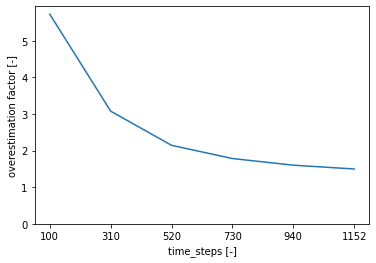

In [144]:
df_time_steps.transpose().plot(ylabel="overestimation factor [-]", xlabel = "time_steps [-]", ylim=0,  legend = False)

<AxesSubplot:xlabel='profiles [-]', ylabel='overestimation factor [-]'>

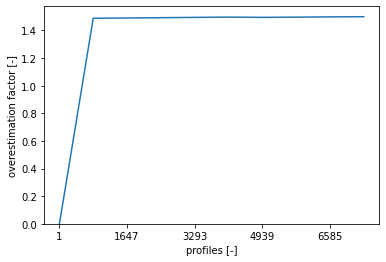

In [143]:
df_profiles.transpose().plot(ylabel="overestimation factor [-]", xlabel = "profiles [-]", ylim=0, legend = False)